# Ajuste de la cantidad de parámetros de una Red Neuronal
# L2 (Ridge regression)
# Dropout

In [1]:
%load_ext autoreload
%autoreload 2
from IPython.display import HTML
import reg_helper as RHelper

/opt/anaconda3/envs/deep/lib/python3.7/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.linear_model.logistic module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.linear_model. Anything that cannot be imported from sklearn.linear_model is now part of the private API.
  warnings.warn(message, FutureWarning)
Using TensorFlow backend.


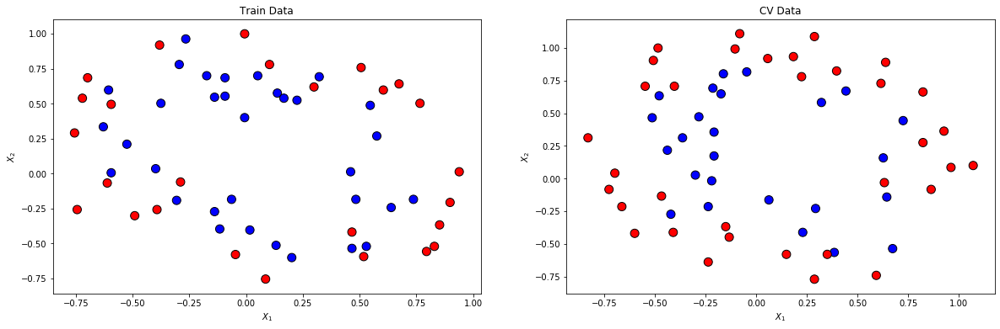

In [2]:
import numpy as np
import draw_nn
from matplotlib import pyplot as plt 
folder = 'data/'
X_train = np.load(folder+'X_train.npy')
X_test = np.load(folder+'X_test.npy')
y_train = np.load(folder+'y_train.npy') 
y_test = np.load(folder+'y_test.npy')

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,6))
RHelper.plot_boundaries(X_train, y_train, ax=ax1)
RHelper.plot_boundaries(X_test, y_test, ax=ax2)
ax1.set_title('Train Data')
ax2.set_title('CV Data')
ax1.set_xlabel('$X_1$')
ax1.set_ylabel('$X_2$')
ax2.set_xlabel('$X_1$')
ax2.set_ylabel('$X_2$')
plt.show()

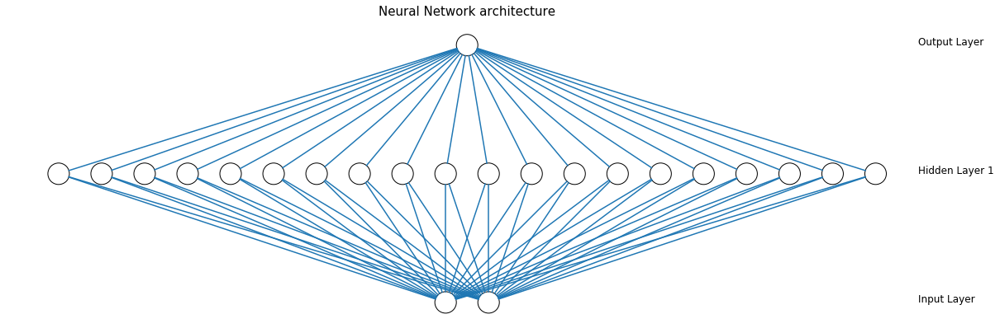

In [3]:
input_shape = 2
hidden_units = 20 # Probar con 3, 10, 20, 200
output_size = 1
network = draw_nn.DrawNN( [input_shape, hidden_units, output_size] )
network.draw()

<video controls src="./images/chips-mlp-20-hidden-1.mp4" width="480"/>

# Ejemplo de red neuronal con todo

In [4]:
from keras.models import Sequential
from keras.layers import Dropout, Dense
from keras import regularizers
from keras.constraints import max_norm
initializer='normal'

In [5]:
max_norm_value = 10
dropout = 0.5
l2_lambda = 1e-4
activation = 'sigmoid'

model = Sequential()
regularizer = regularizers.l2(l2_lambda)
model.add(Dense(hidden_units,input_dim=input_shape,  
                kernel_initializer=initializer, 
                bias_initializer=initializer,
                activation=activation, 
                kernel_regularizer=regularizer, 
                bias_regularizer=regularizer,
                kernel_constraint=max_norm(max_norm_value),
                bias_constraint=max_norm(max_norm_value)
               ))
model.add(Dropout(dropout))
model.add(Dense(output_size, 
            activation='sigmoid', 
            kernel_initializer=initializer, 
            bias_initializer=initializer,
            name='Salida',
            kernel_regularizer=regularizer, 
            bias_regularizer=regularizer
           ))

model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 20)                60        
_________________________________________________________________
dropout_1 (Dropout)          (None, 20)                0         
_________________________________________________________________
Salida (Dense)               (None, 1)                 21        
Total params: 81
Trainable params: 81
Non-trainable params: 0
_________________________________________________________________


# La llamaremos desde la librería por comodidad

In [6]:
two_layer_model = RHelper.get_two_layer_model_L2(input_shape, output_size, hidden_units=hidden_units, lr=0.1, l2_lambda=0, decay=0.0)
two_layer_model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2 (Dense)              (None, 20)                60        
_________________________________________________________________
Salida (Dense)               (None, 1)                 21        
Total params: 81
Trainable params: 81
Non-trainable params: 0
_________________________________________________________________


# Que opciones tenemos con Keras en una red neuronal:

- Regresión de Ridge L2 o L1
- max_norm (Constraints - Restricciones)
- Dropout
- Early stoping

Probar Relu y sigmoidea y ver diferencias

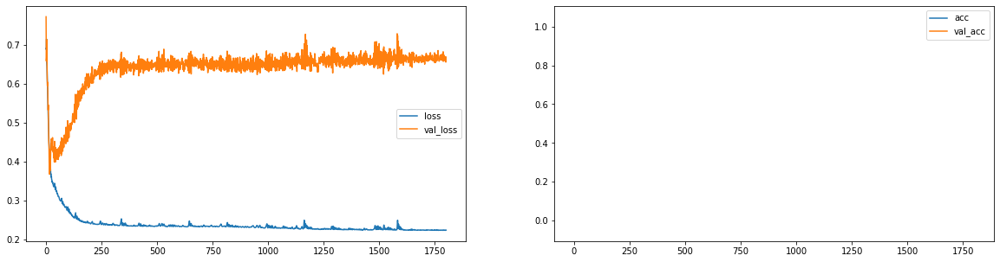

In [7]:
from fnn_helper import PlotLosses
from keras import optimizers
epochs = 2000 #adam 3000, sgd 30000
lr = 0.1
decay=0
hidden_units = 100
optim = optimizers.Adam(lr=lr) # cambiar a momentum 0.9 y lr a 5
batch_size = 59 # 10 y 59
activation='relu'
l2_lambda = 1e-4
dropout = None # 0.5
max_norm_value = None # 5 # None

plot_losses = PlotLosses(plot_interval=200, evaluate_interval=None, x_val=X_test, y_val_categorical=y_test)
two_layer_model = RHelper.get_two_layer_model_L2(input_shape, 
                                                 output_size, 
                                                 hidden_units=hidden_units, 
                                                 # lr=lr, 
                                                 l2_lambda=l2_lambda, 
                                                 dropout=dropout,
                                                 decay=decay,
                                                 optim = optim,
                                                 activation=activation, 
                                                 max_norm_value=max_norm_value
                                                )
two_layer_model.fit(X_train, 
          y_train, batch_size = batch_size,
          epochs=epochs, 
          verbose=0, 
          validation_data=(X_test, y_test), 
          callbacks=[plot_losses],
         )

¿Que diferencias se ven entre?
- ADAM y SGD. En cuanto a tiempos, curva de entrenamiento (monotona decreciente?)
- mini-batch size?
- con el decay?

In [8]:
# Para calcular norma en cada epoch
def get_weights_array(ws):
    weights_norm = []
    for weights in ws:
        weights_norm.append(np.linalg.norm(weights[0]))
    return weights_norm

59/59 [==============================] - 0s 23us/step


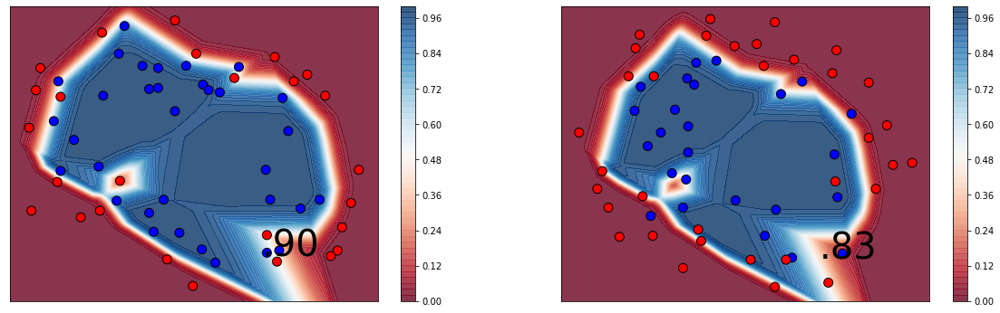

In [9]:
# two_layer_model.load_weights('SGD-3000-epochs-20-hu.hdf5')
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,6))
RHelper.plot_boundaries_keras(X_train, y_train, two_layer_model.evaluate(X_train, y_train)[1], two_layer_model.predict_proba, h = 0.01, margin=0.1, ax=ax1)
RHelper.plot_boundaries_keras(X_test, y_test, two_layer_model.evaluate(X_test, y_test)[1], two_layer_model.predict_proba, h = 0.01, margin=0.1, ax=ax2)
plt.show()

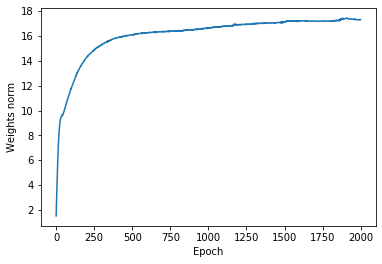

In [10]:
plt.plot(RHelper.get_weights_array(plot_losses.weights))
plt.xlabel('Epoch')
plt.ylabel('Weights norm')
plt.show()

# Diferencias fundamentales con Regresión logística
- No hay garantía de converger al mínimo absoluto
- Cada corrida puede dar resultados diferentes debido a la inicialización
- La función de activación tiene gran influencia en el resultado del modelo obtenido
- La regularización se aplica a nivel de capa
- Existe el concepto de regularización de activaciones y keras lo soporta (https://github.com/keras-team/keras/issues/1618)

# Dropout

- Elimina conexiones aleatoriamente al momento de entrenamiento (Especificamente, multiplica por cero algunas de las activaciones a la salida de una capa o eventualemente a la entrada de la red, aunque esto no es tan usual)
- keep_prob es la probabilidad de que las conexiones no se eliminen
- En keras se define el dropout_rate que es (1 - keep_prob)
- Al momento de entrenamiento, cuando se eliminan las conexiones, se dividen las salidas de las activaciones por 1/keep_prob para mantener en promedio lo que llega a la capa siguiente 
- En momento de evaluación no se eliminan conexiones.

<img src="./images/dropout.png" alt="Drawing" />

**Tips:**  
- Usar un valor bajo entre 20% y 50%
- Usar una "red grande", muchos parámetros
- Usarlo tanto en la capa visible (entrada) como en las capas ocultas. La aplicación de dropout en cada capa a mostrado buenos resultados
- Usar un learning rate grande con decay y momentum. Incrementar el learning rate por un factor de 10 o hasta 100 y usar momentum del entre 0.9 y 0.99.
- Usar max-norm. Valores en el orden de 4 o 5 han mostrado buenos resultados

Referencias: [[1]](https://www.coursera.org/learn/deep-neural-network/lecture/eM33A/dropout-regularization), [[2]](https://machinelearningmastery.com/dropout-regularization-deep-learning-models-keras/)

# Busqueda de cantidad de parámetros

Correr varias veces y cambiar relu por sigmoidea

In [29]:
from keras.callbacks import EarlyStopping, ReduceLROnPlateau

cantidad de unidades ocultas: 2, función de activación: relu


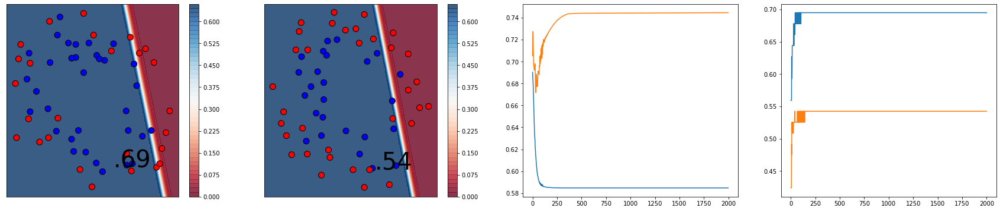

cantidad de unidades ocultas: 3, función de activación: relu


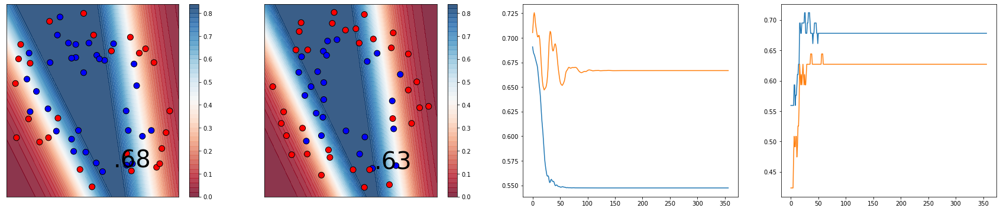

cantidad de unidades ocultas: 5, función de activación: relu


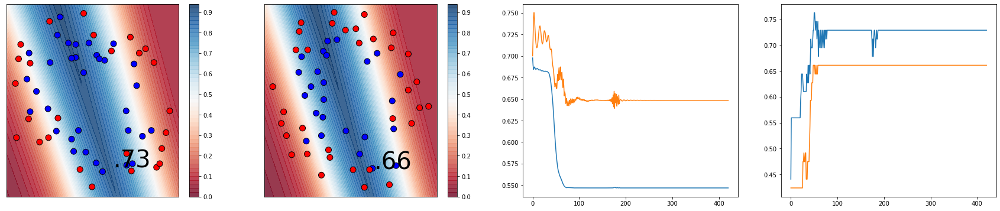

cantidad de unidades ocultas: 10, función de activación: relu


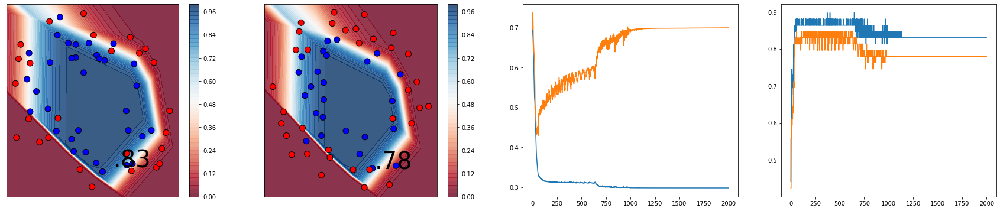

cantidad de unidades ocultas: 20, función de activación: relu


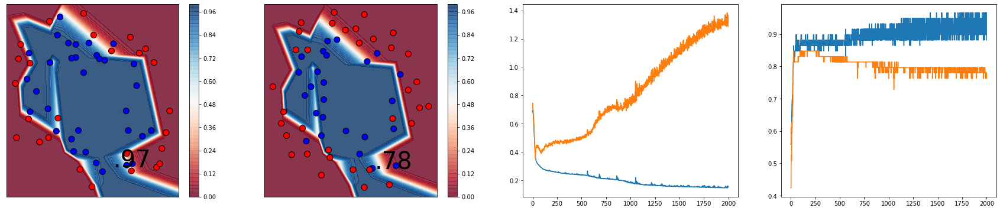

cantidad de unidades ocultas: 100, función de activación: relu


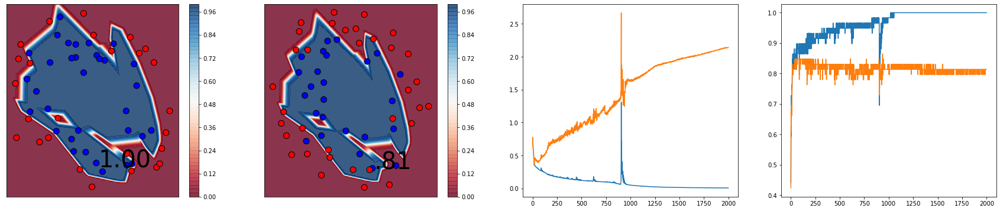

cantidad de unidades ocultas: 500, función de activación: relu


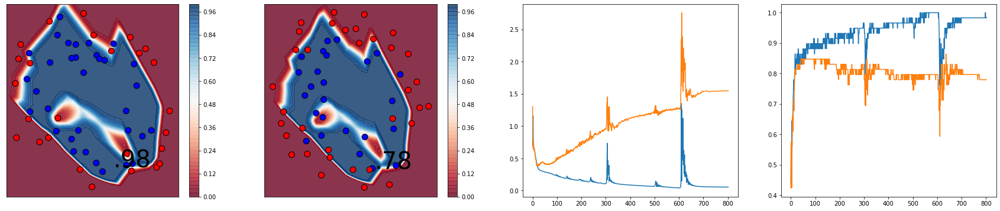

In [36]:
escb = EarlyStopping(
    monitor="loss",
    min_delta=0,
    patience=200,
    verbose=0,
    mode="auto",
    baseline=None,
)

ropcb = ReduceLROnPlateau(monitor="loss", factor=0.2, verbose=0, min_lr=0.001, patience=100)

for hidden_units in [2, 3, 5, 10, 20, 100, 500]:
    epochs = 2000 #adam 3000, sgd 30000
    lr = 0.1
    l2_lambda=0 #1e-3
    dropout=0
    decay=0
    # hidden_units = 20
    optim = optimizers.Adam(lr=lr) # cambiar a momentum 0.9 y lr a 5
    batch_size = 59 # 10 y 59
    activation='relu'

    plot_losses = PlotLosses(plot_interval=200, evaluate_interval=None, x_val=X_test, y_val_categorical=y_test)
    two_layer_model = RHelper.get_two_layer_model_L2(input_shape, 
                                                     output_size, 
                                                     hidden_units=hidden_units, 
                                                     # lr=lr, 
                                                     l2_lambda=l2_lambda, 
                                                     decay=decay,
                                                     optim = optim,
                                                     activation=activation,
                                                     dropout=dropout
                                                    )
    history = two_layer_model.fit(X_train, 
              y_train, batch_size = batch_size,
              epochs=epochs, 
              verbose=0, 
              validation_data=(X_test, y_test), 
              callbacks=[escb, ropcb],
             )
    print(f'cantidad de unidades ocultas: {hidden_units}, función de activación: {activation}')
    f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(30,6))
    RHelper.plot_boundaries_keras(X_train, y_train, two_layer_model.evaluate(X_train, y_train, verbose=0)[1], two_layer_model.predict_proba, h = 0.01, margin=0.1, ax=ax1)
    RHelper.plot_boundaries_keras(X_test, y_test, two_layer_model.evaluate(X_test, y_test, verbose=0)[1], two_layer_model.predict_proba, h = 0.01, margin=0.1, ax=ax2)
    ax3.plot(history.history['loss'])
    ax3.plot(history.history['val_loss'])
    ax4.plot(history.history['accuracy'])
    ax4.plot(history.history['val_accuracy'])
    plt.show()

cantidad de unidades ocultas: 2, función de activación: sigmoid


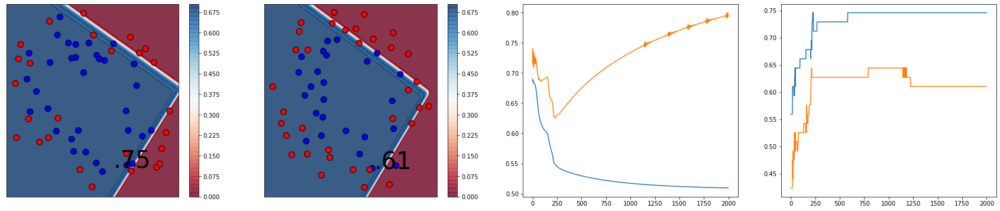

cantidad de unidades ocultas: 3, función de activación: sigmoid


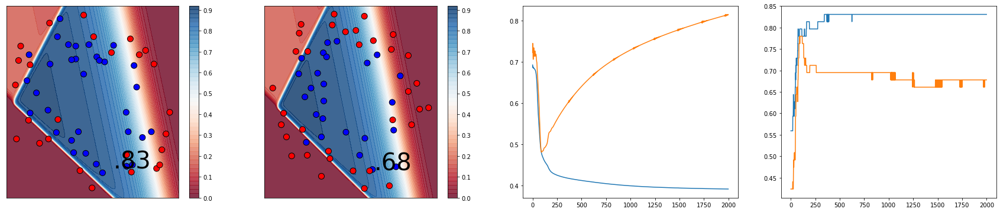

cantidad de unidades ocultas: 5, función de activación: sigmoid


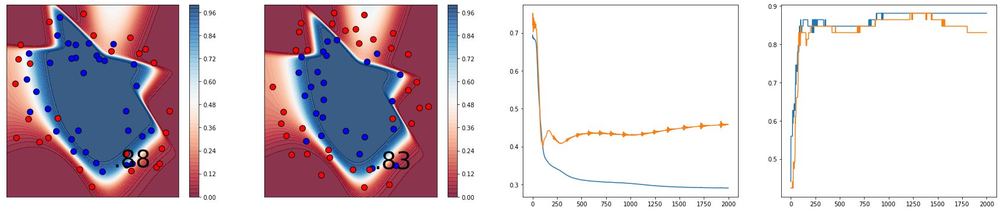

cantidad de unidades ocultas: 10, función de activación: sigmoid


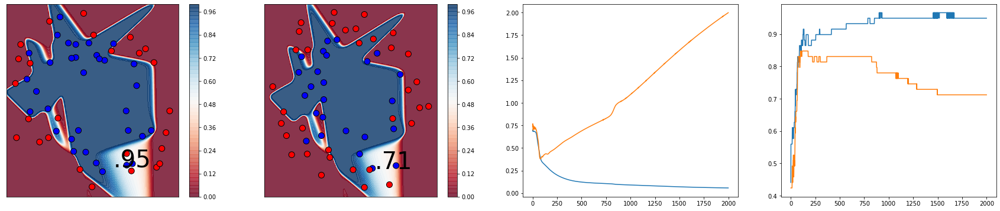

cantidad de unidades ocultas: 20, función de activación: sigmoid


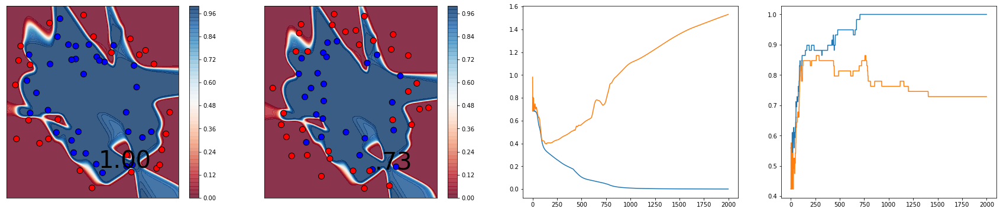

cantidad de unidades ocultas: 100, función de activación: sigmoid


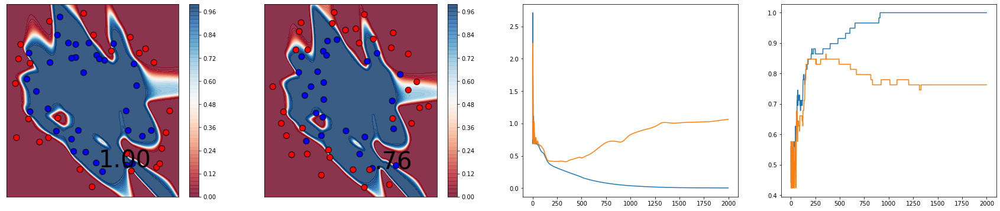

cantidad de unidades ocultas: 500, función de activación: sigmoid


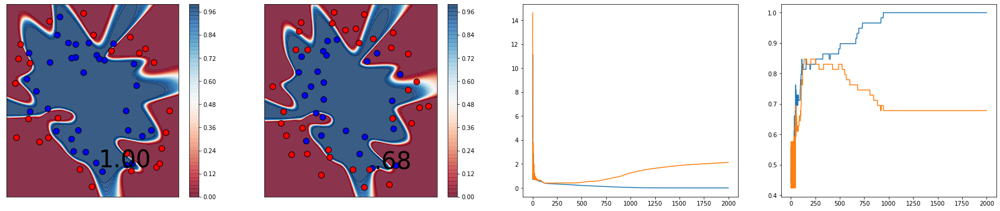

In [106]:
# escb = EarlyStopping(
#     monitor="loss",
#     min_delta=0,
#     patience=200,
#     verbose=0,
#     mode="auto",
#     baseline=None,
# )

# ropcb = ReduceLROnPlateau(monitor="loss", factor=0.2, verbose=0, min_lr=0.001, patience=100)

for hidden_units in [2, 3, 5, 10, 20, 100, 500]:
    escb = EarlyStopping(monitor="loss", patience=200, verbose=0)
    ropcb = ReduceLROnPlateau(monitor="loss", factor=0.2, verbose=0, min_lr=0.001, patience=100)
    epochs = 2000 #adam 3000, sgd 30000
    lr = 0.1
    decay=0
    l2_lambda=0
    dropout=0
    # hidden_units = 20
    optim = optimizers.Adam(lr=lr) # cambiar a momentum 0.9 y lr a 5
    batch_size = 59 # 10 y 59
    activation='sigmoid'

    plot_losses = PlotLosses(plot_interval=200, evaluate_interval=None, x_val=X_test, y_val_categorical=y_test)
    two_layer_model = RHelper.get_two_layer_model_L2(input_shape, 
                                                     output_size, 
                                                     hidden_units=hidden_units, 
                                                     # lr=lr, 
                                                     l2_lambda=l2_lambda, 
                                                     decay=decay,
                                                     optim = optim,
                                                     activation=activation,
                                                     dropout=dropout
                                                    )
    history = two_layer_model.fit(X_train, 
              y_train, batch_size = batch_size,
              epochs=epochs, 
              verbose=0, 
              validation_data=(X_test, y_test), 
              callbacks=[escb, ropcb],
             )
    print(f'cantidad de unidades ocultas: {hidden_units}, función de activación: {activation}')
    f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(30,6))
    RHelper.plot_boundaries_keras(X_train, y_train, two_layer_model.evaluate(X_train, y_train, verbose=0)[1], two_layer_model.predict_proba, h = 0.01, margin=0.1, ax=ax1)
    RHelper.plot_boundaries_keras(X_test, y_test, two_layer_model.evaluate(X_test, y_test, verbose=0)[1], two_layer_model.predict_proba, h = 0.01, margin=0.1, ax=ax2)
    ax3.plot(history.history['loss'])
    ax3.plot(history.history['val_loss'])
    ax4.plot(history.history['accuracy'])
    ax4.plot(history.history['val_accuracy'])
    plt.show()

In [86]:
from keras.callbacks import ModelCheckpoint
from glob import glob

In [82]:
import os

cantidad de unidades ocultas: 2, función de activación: sigmoid
No grabo ninguno mejor?


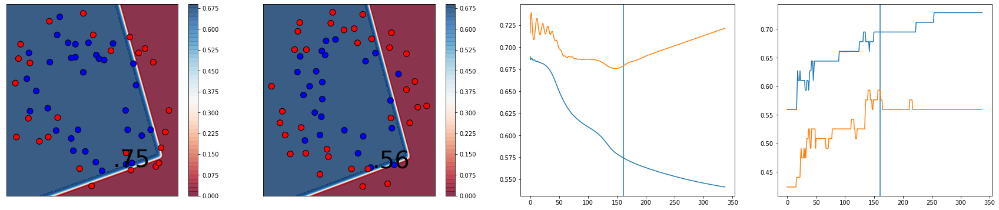

cantidad de unidades ocultas: 3, función de activación: sigmoid
No grabo ninguno mejor?


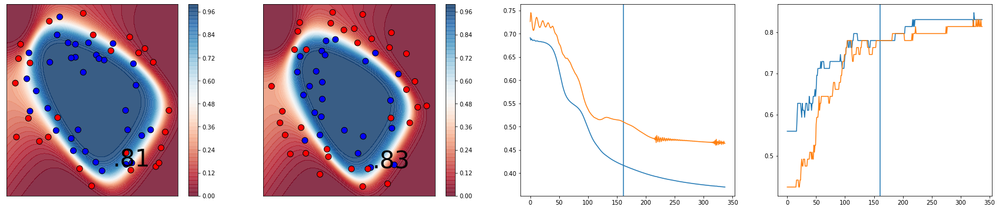

KeyboardInterrupt: 

In [114]:
file_prefix = 'best_model_es_'



filenames = glob('best_model_*')
for name in filenames:
    os.remove(name)
        
for hidden_units in [2, 3, 5, 10, 20, 100, 500]:
    mcpcb = ModelCheckpoint(file_prefix+'{epoch}.hdf5', monitor='val_accuracy', save_best_only=True, verbose=0)
    escb = EarlyStopping(monitor="loss", patience=200, verbose=0)
    ropcb = ReduceLROnPlateau(monitor="loss", factor=0.2, verbose=0, min_lr=0.001, patience=100)

    epochs = 2000 #adam 3000, sgd 30000
    lr = 0.1
    decay=0
    l2_lambda=0
    dropout=0
    # hidden_units = 20
    optim = optimizers.Adam(lr=lr) # cambiar a momentum 0.9 y lr a 5
    batch_size = 59 # 10 y 59
    activation='sigmoid'

    plot_losses = PlotLosses(plot_interval=200, evaluate_interval=None, x_val=X_test, y_val_categorical=y_test)
    two_layer_model = RHelper.get_two_layer_model_L2(input_shape, 
                                                     output_size, 
                                                     hidden_units=hidden_units, 
                                                     # lr=lr, 
                                                     l2_lambda=l2_lambda, 
                                                     decay=decay,
                                                     optim = optim,
                                                     activation=activation,
                                                     dropout=dropout
                                                    )
    history = two_layer_model.fit(X_train, 
              y_train, batch_size = batch_size,
              epochs=epochs, 
              verbose=0, 
              validation_data=(X_test, y_test), 
              callbacks=[escb, ropcb, mcpcb],
             )
    print(f'cantidad de unidades ocultas: {hidden_units}, función de activación: {activation}')
    
    f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(30,6))
    filenames = glob('best_model_*')
    best_epochs = [int(name.split('_')[-1].split('.hdf5')[0]) for name in filenames]
    if len(best_epochs) > 0:
        best_epoch = max(best_epochs)
        two_layer_model.load_weights(f'{file_prefix}{best_epoch}.hdf5')
    else:
        print('No grabo ninguno mejor?')
    for name in filenames:
        os.remove(name)
    RHelper.plot_boundaries_keras(X_train, y_train, two_layer_model.evaluate(X_train, y_train, verbose=0)[1], two_layer_model.predict_proba, h = 0.01, margin=0.1, ax=ax1)
    RHelper.plot_boundaries_keras(X_test, y_test, two_layer_model.evaluate(X_test, y_test, verbose=0)[1], two_layer_model.predict_proba, h = 0.01, margin=0.1, ax=ax2)
    ax3.axvline(best_epoch)
    ax3.plot(history.history['loss'][:best_epoch+int(best_epoch*1.1)])
    ax3.plot(history.history['val_loss'][:best_epoch+int(best_epoch*1.1)])
    ax4.axvline(best_epoch)
    ax4.plot(history.history['accuracy'][:best_epoch+int(best_epoch*1.1)])
    ax4.plot(history.history['val_accuracy'][:best_epoch+int(best_epoch*1.1)])
    plt.show()

In [93]:
best_epochs,  best_epoch

([35, 19, 188, 193, 198, 25, 117, 1, 26, 190, 40, 132, 164], 198)

# L2

l2_lambda: 0, función de activación: sigmoid


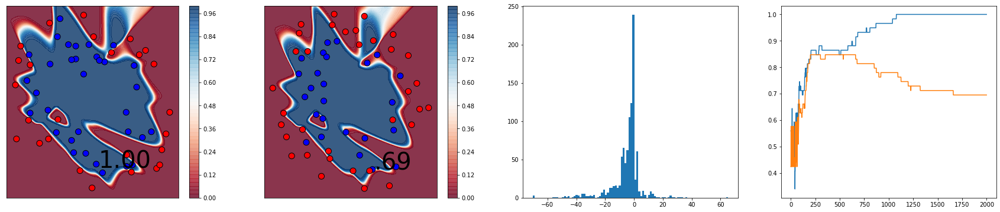

l2_lambda: 1e-05, función de activación: sigmoid


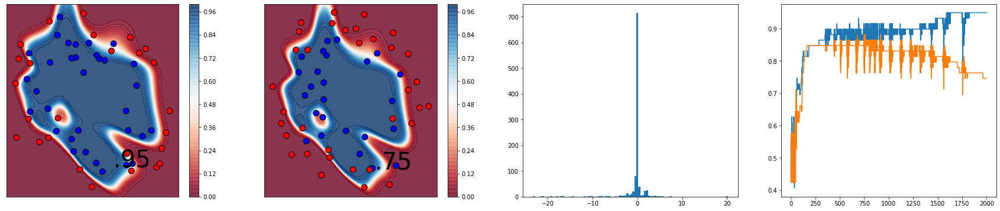

l2_lambda: 3.1622776601683795e-05, función de activación: sigmoid


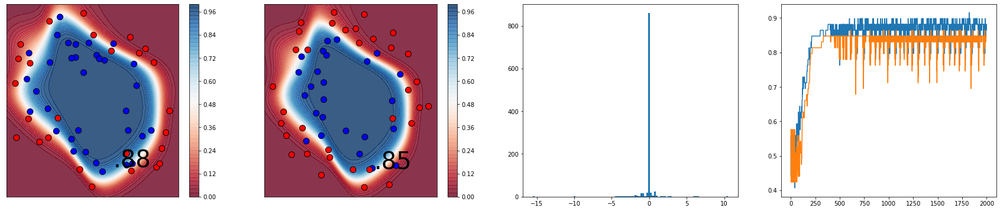

l2_lambda: 0.0001, función de activación: sigmoid


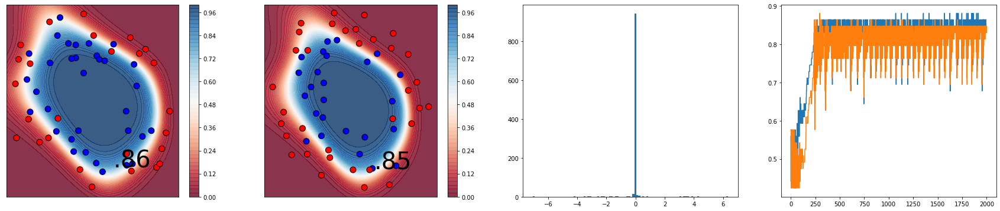

l2_lambda: 0.00031622776601683794, función de activación: sigmoid


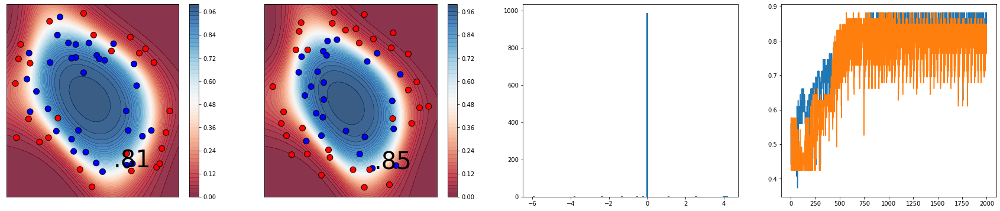

l2_lambda: 0.001, función de activación: sigmoid


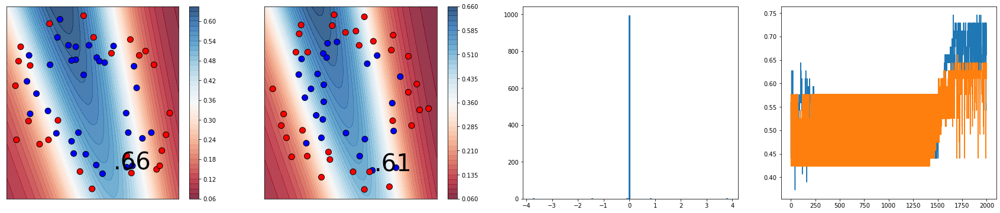

In [140]:
lambdas = np.logspace(-5, -3, 5)
lambdas = [0] + list(lambdas)
for l2_lambda in lambdas:
    hidden_units = 500
    escb = EarlyStopping(monitor="loss", patience=100, verbose=0)
    ropcb = ReduceLROnPlateau(monitor="loss", factor=0.2, verbose=0, min_lr=0.001, patience=50)
    epochs = 2000 #adam 3000, sgd 30000
    lr = 0.1
    decay=0
    dropout=0
    # hidden_units = 20
    optim = optimizers.Adam(lr=lr) # cambiar a momentum 0.9 y lr a 5
    batch_size = 59 # 10 y 59
    activation='sigmoid'

    plot_losses = PlotLosses(plot_interval=200, evaluate_interval=None, x_val=X_test, y_val_categorical=y_test)
    two_layer_model = RHelper.get_two_layer_model_L2(input_shape, 
                                                     output_size, 
                                                     hidden_units=hidden_units, 
                                                     # lr=lr, 
                                                     l2_lambda=l2_lambda, 
                                                     decay=decay,
                                                     optim = optim,
                                                     activation=activation,
                                                     dropout=dropout
                                                    )
    history = two_layer_model.fit(X_train, 
              y_train, batch_size = batch_size,
              epochs=epochs, 
              verbose=0, 
              validation_data=(X_test, y_test), 
              # callbacks=[escb, ropcb],
             )
    print(f'l2_lambda: {l2_lambda}, función de activación: {activation}')
    f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(30,6))
    RHelper.plot_boundaries_keras(X_train, y_train, two_layer_model.evaluate(X_train, y_train, verbose=0)[1], two_layer_model.predict_proba, h = 0.01, margin=0.1, ax=ax1)
    RHelper.plot_boundaries_keras(X_test, y_test, two_layer_model.evaluate(X_test, y_test, verbose=0)[1], two_layer_model.predict_proba, h = 0.01, margin=0.1, ax=ax2)
#     ax3.plot(history.history['loss'])
#     ax3.plot(history.history['val_loss'])
    ax3.hist(two_layer_model.get_weights()[0].reshape(-1), 100)
    ax4.plot(history.history['accuracy'])
    ax4.plot(history.history['val_accuracy'])
    plt.show()

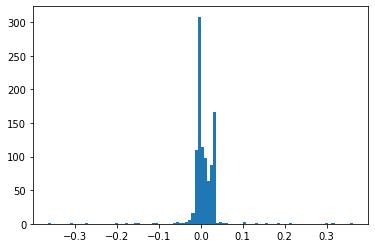

In [139]:
plt.hist(two_layer_model.get_weights()[0].reshape(-1), 100)
plt.show()

# L1

In [11]:
from keras import optimizers
from fnn_helper import PlotLosses

l1_lambda: 0, función de activación: sigmoid


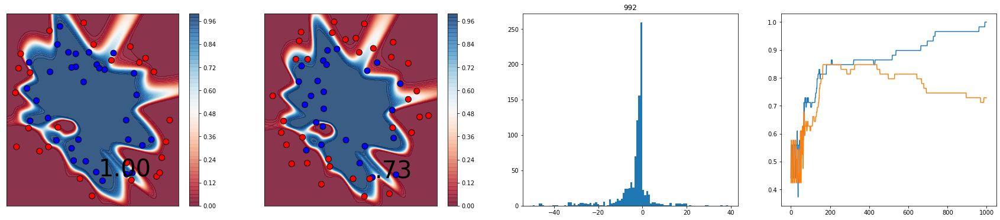

l1_lambda: 1e-05, función de activación: sigmoid


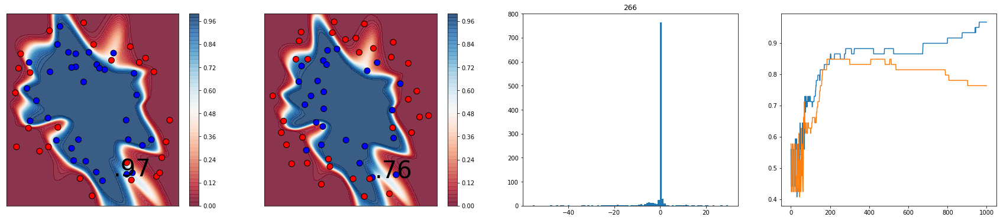

l1_lambda: 1.199353946209233e-05, función de activación: sigmoid


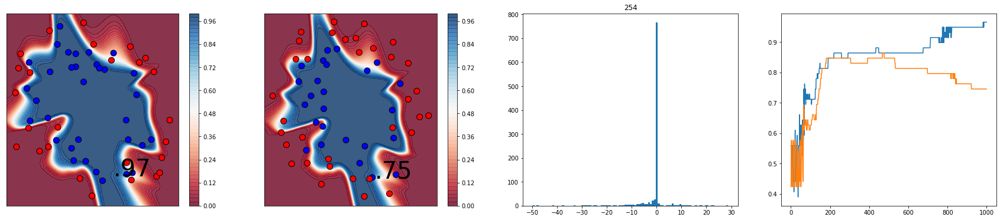

l1_lambda: 1.438449888287663e-05, función de activación: sigmoid


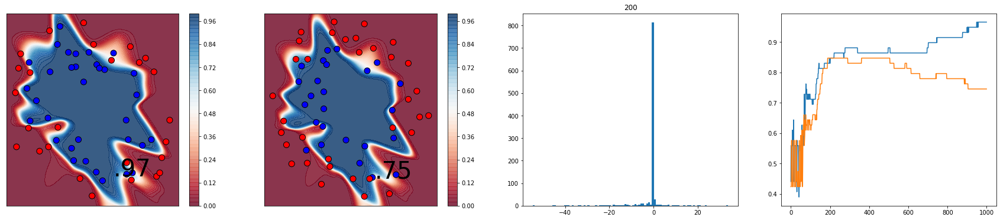

l1_lambda: 1.725210549942039e-05, función de activación: sigmoid


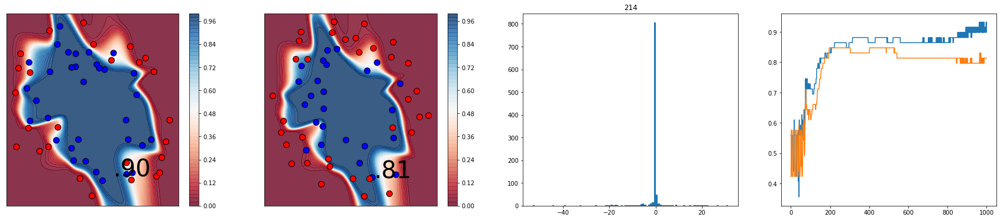

l1_lambda: 2.06913808111479e-05, función de activación: sigmoid


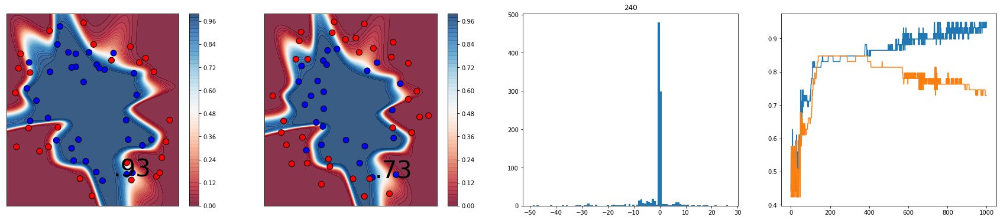

l1_lambda: 2.481628922836824e-05, función de activación: sigmoid


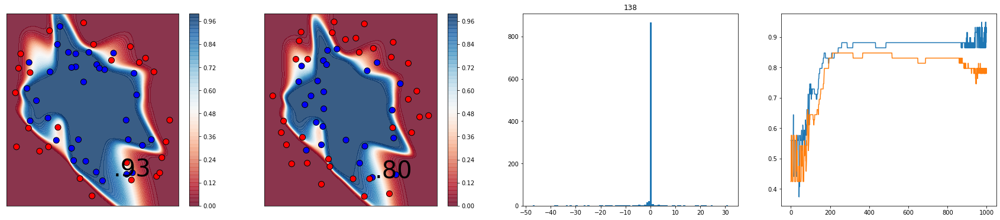

l1_lambda: 2.9763514416313192e-05, función de activación: sigmoid


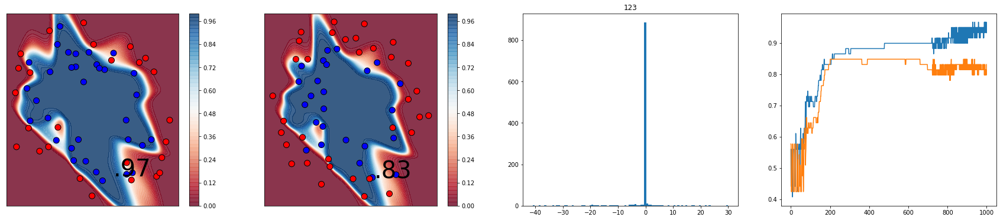

l1_lambda: 3.5696988468260624e-05, función de activación: sigmoid


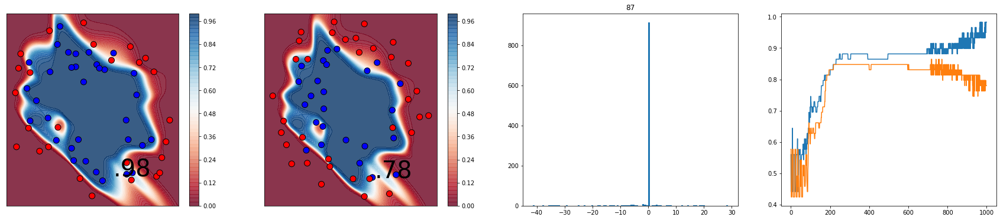

l1_lambda: 4.281332398719396e-05, función de activación: sigmoid


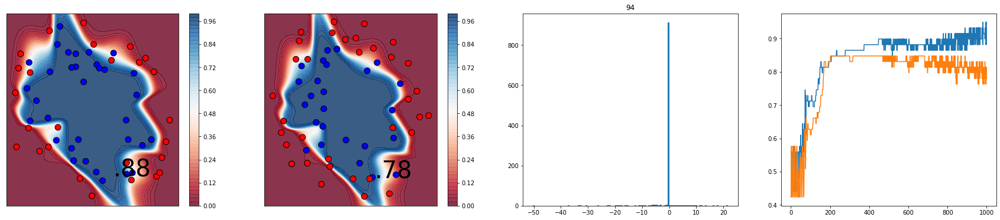

l1_lambda: 5.1348329074375493e-05, función de activación: sigmoid


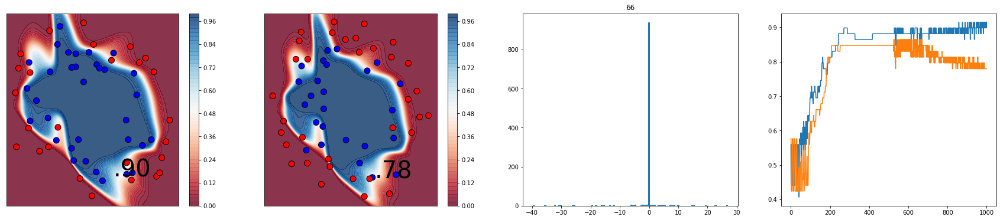

l1_lambda: 6.158482110660267e-05, función de activación: sigmoid


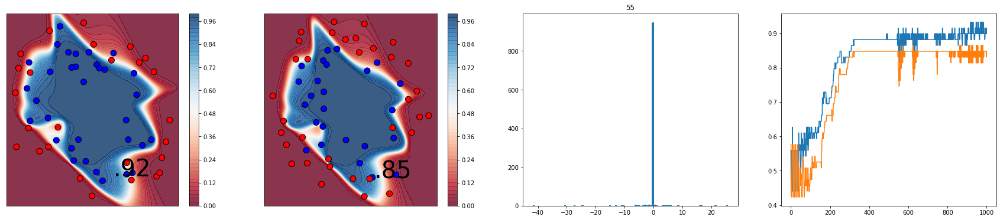

l1_lambda: 7.386199822079358e-05, función de activación: sigmoid


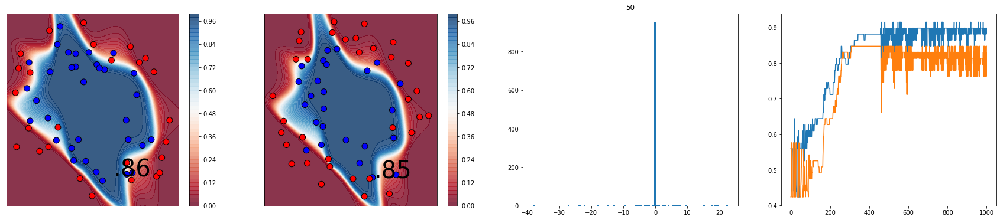

l1_lambda: 8.858667904100833e-05, función de activación: sigmoid


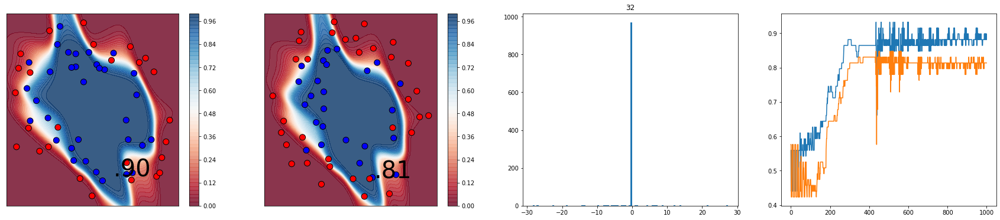

l1_lambda: 0.0001062467830894041, función de activación: sigmoid


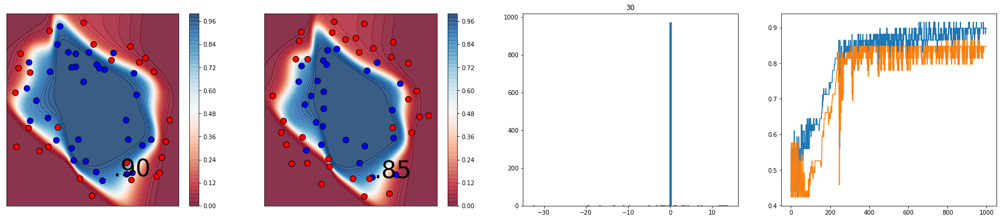

l1_lambda: 0.00012742749857031334, función de activación: sigmoid


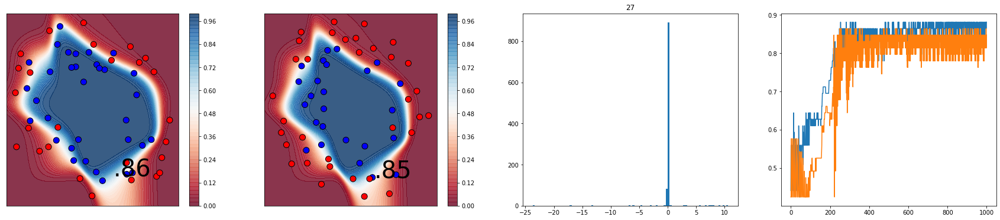

l1_lambda: 0.00015283067326587687, función de activación: sigmoid


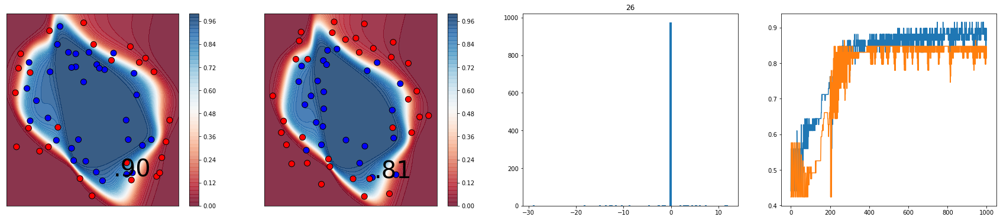

l1_lambda: 0.00018329807108324357, función de activación: sigmoid


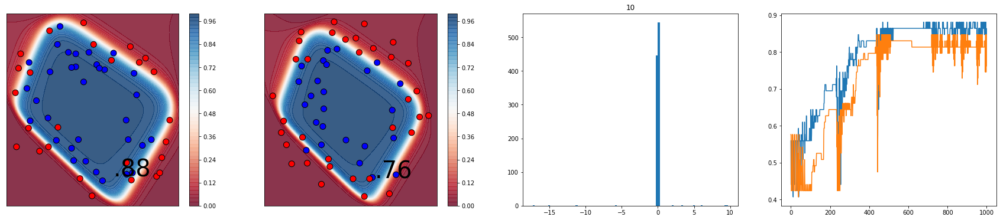

l1_lambda: 0.0002198392648862289, función de activación: sigmoid


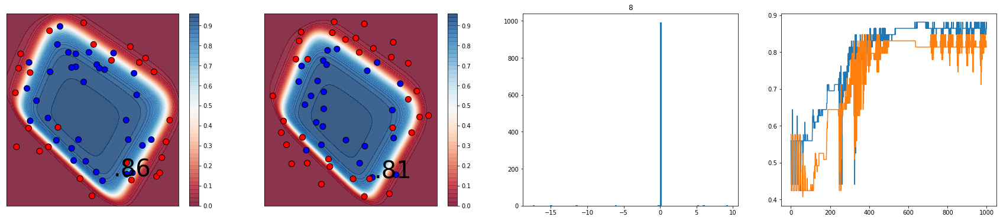

l1_lambda: 0.00026366508987303583, función de activación: sigmoid


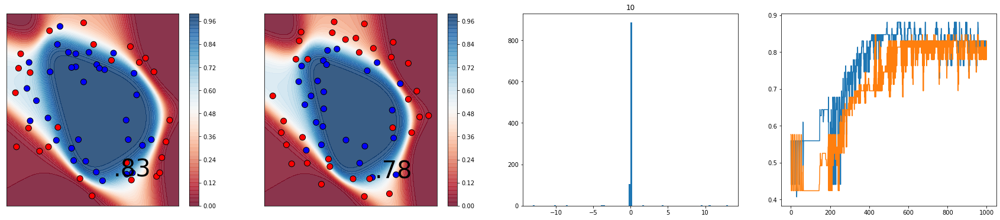

l1_lambda: 0.00031622776601683794, función de activación: sigmoid


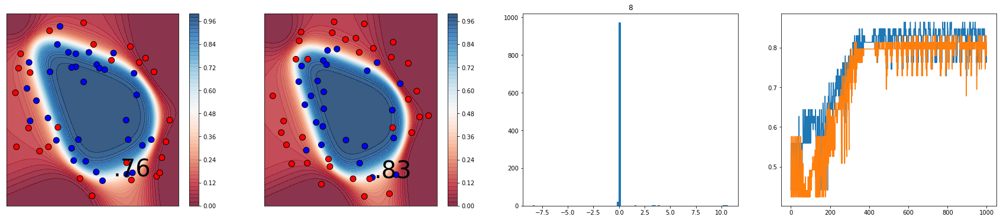

In [217]:
lambdas = np.logspace(-5, -3.5, 20)
lambdas = [0] + list(lambdas)
for i, l1_lambda in enumerate(lambdas):
    hidden_units = 500
#     escb = EarlyStopping(monitor="loss", patience=100, verbose=0)
#     ropcb = ReduceLROnPlateau(monitor="loss", factor=0.2, verbose=0, min_lr=0.001, patience=50)
    epochs = 1000 #adam 3000, sgd 30000
    lr = 0.1
    decay=0
    dropout=0
    # hidden_units = 20
    optim = optimizers.Adam(lr=lr) # cambiar a momentum 0.9 y lr a 5
    batch_size = 59 # 10 y 59
    activation='sigmoid'

    plot_losses = PlotLosses(plot_interval=200, evaluate_interval=None, x_val=X_test, y_val_categorical=y_test)
    two_layer_model = RHelper.get_two_layer_model_L2(input_shape, 
                                                     output_size, 
                                                     hidden_units=hidden_units, 
                                                     # lr=lr, 
                                                     l1_lambda=l1_lambda, 
                                                     decay=decay,
                                                     optim = optim,
                                                     activation=activation,
                                                     dropout=dropout
                                                    )
    history = two_layer_model.fit(X_train, 
              y_train, batch_size = batch_size,
              epochs=epochs, 
              verbose=0, 
              validation_data=(X_test, y_test), 
              # callbacks=[escb, ropcb],
             )
    print(f'l1_lambda: {l1_lambda}, función de activación: {activation}')
    f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(30,6))
    RHelper.plot_boundaries_keras(X_train, y_train, two_layer_model.evaluate(X_train, y_train, verbose=0)[1], two_layer_model.predict_proba, h = 0.01, margin=0.1, ax=ax1)
    RHelper.plot_boundaries_keras(X_test, y_test, two_layer_model.evaluate(X_test, y_test, verbose=0)[1], two_layer_model.predict_proba, h = 0.01, margin=0.1, ax=ax2)
#     ax3.plot(history.history['loss'])
#     ax3.plot(history.history['val_loss'])
    ax3.hist(two_layer_model.get_weights()[0].reshape(-1), 100)
    ax4.plot(history.history['accuracy'])
    ax4.plot(history.history['val_accuracy'])
    ax3.set_title(f'{((np.abs(two_layer_model.get_weights()[0]))>0.1).sum()}')
    two_layer_model.save(f'l1_{l1_lambda}.hdf5')
    plt.show()

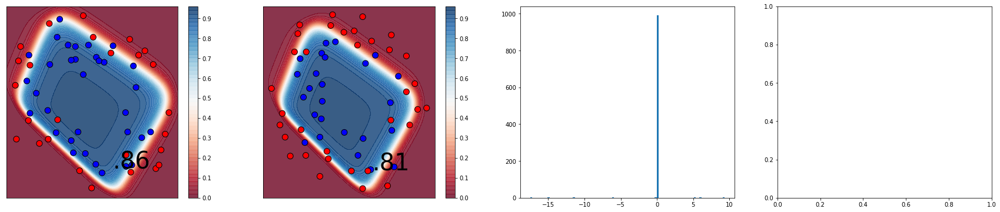

In [218]:
file_name = 'l1_0.0002198392648862289.hdf5'
two_layer_model.load_weights(file_name)
f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(30,6))
ax3.hist(two_layer_model.get_weights()[0].reshape(-1), 100)
RHelper.plot_boundaries_keras(X_train, y_train, two_layer_model.evaluate(X_train, y_train, verbose=0)[1], two_layer_model.predict_proba, h = 0.01, margin=0.1, ax=ax1)
RHelper.plot_boundaries_keras(X_test, y_test, two_layer_model.evaluate(X_test, y_test, verbose=0)[1], two_layer_model.predict_proba, h = 0.01, margin=0.1, ax=ax2)

In [243]:
two_layer_model.load_weights(file_name)
thres = 5
l1_weights = two_layer_model.get_weights()
print((np.abs(l1_weights[0])>thres).sum(), (np.abs(l1_weights[0])>0).sum())
two_layer_model.evaluate(X_train, y_train, verbose=0)[1]

8 1000


0.8644067645072937

In [244]:
l1_weights = two_layer_model.get_weights()
l1_weights[0] = l1_weights[0]*(np.abs(l1_weights[0])>thres)

In [245]:
two_layer_model.set_weights(l1_weights)

In [246]:
# two_layer_model.get_weights()[0]

In [247]:
two_layer_model.evaluate(X_train, y_train, verbose=0)[1]

0.8644067645072937

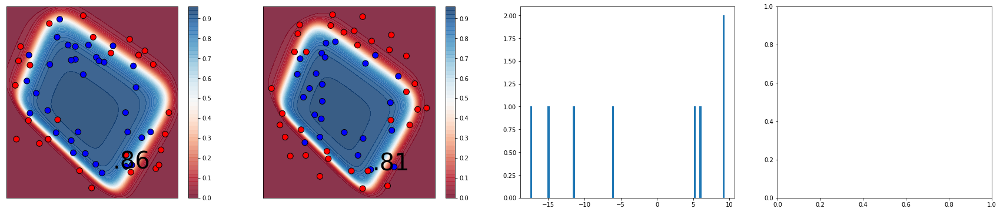

In [249]:
f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(30,6))
ax3.hist(two_layer_model.get_weights()[0][two_layer_model.get_weights()[0]!=0].reshape(-1), 100)
RHelper.plot_boundaries_keras(X_train, y_train, two_layer_model.evaluate(X_train, y_train, verbose=0)[1], two_layer_model.predict_proba, h = 0.01, margin=0.1, ax=ax1)
RHelper.plot_boundaries_keras(X_test, y_test, two_layer_model.evaluate(X_test, y_test, verbose=0)[1], two_layer_model.predict_proba, h = 0.01, margin=0.1, ax=ax2)

In [150]:
from keras.models import Sequential

In [177]:
from keras.layers import Dropout

model = Sequential()
model.add(Dense(500,  input_dim=2,
                activation='sigmoid'))
model.add(Dropout(dropout))
model.add(Dense(1, activation='sigmoid'))
model.summary()

Model: "sequential_370"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_379 (Dense)            (None, 500)               1500      
_________________________________________________________________
dropout_358 (Dropout)        (None, 500)               0         
_________________________________________________________________
dense_380 (Dense)            (None, 1)                 501       
Total params: 2,001
Trainable params: 2,001
Non-trainable params: 0
_________________________________________________________________


# Dropout


Epoch 02818: ReduceLROnPlateau reducing learning rate to 0.05.

Epoch 03018: ReduceLROnPlateau reducing learning rate to 0.01.
dropout: 0, función de activación: sigmoid


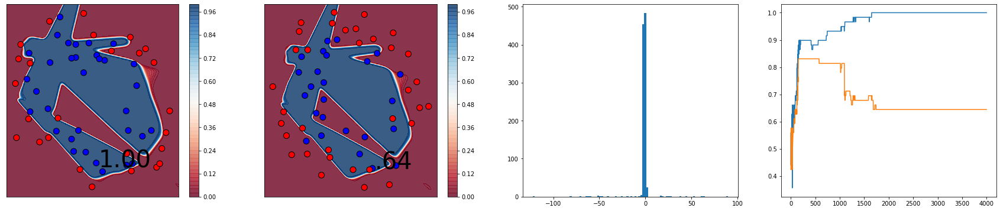


Epoch 01878: ReduceLROnPlateau reducing learning rate to 0.05.

Epoch 02343: ReduceLROnPlateau reducing learning rate to 0.01.
dropout: 0.1, función de activación: sigmoid


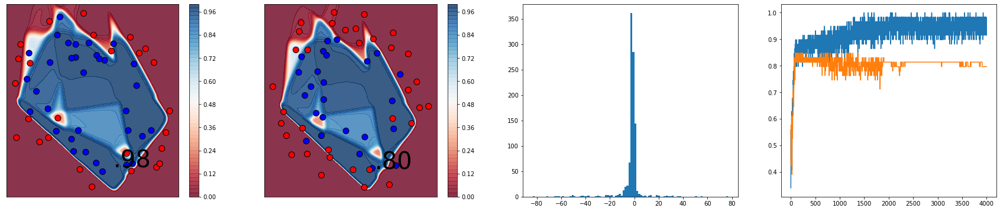


Epoch 01686: ReduceLROnPlateau reducing learning rate to 0.05.

Epoch 02093: ReduceLROnPlateau reducing learning rate to 0.01.
dropout: 0.25, función de activación: sigmoid


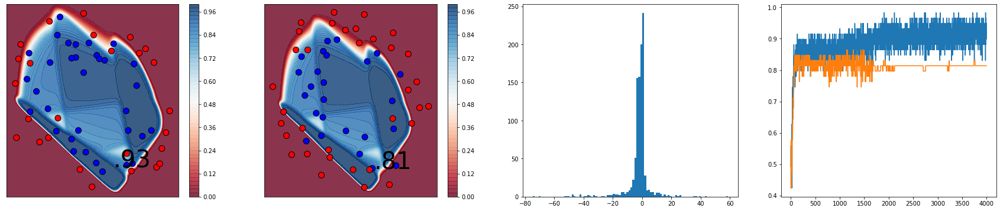


Epoch 00568: ReduceLROnPlateau reducing learning rate to 0.05.

Epoch 00918: ReduceLROnPlateau reducing learning rate to 0.01.
dropout: 0.5, función de activación: sigmoid


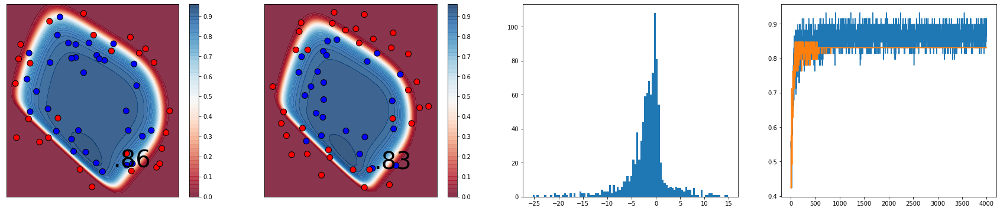


Epoch 00493: ReduceLROnPlateau reducing learning rate to 0.05.

Epoch 01008: ReduceLROnPlateau reducing learning rate to 0.01.
dropout: 0.75, función de activación: sigmoid


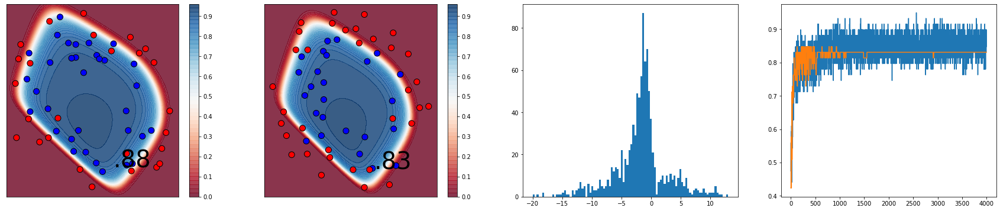


Epoch 00366: ReduceLROnPlateau reducing learning rate to 0.05.

Epoch 00606: ReduceLROnPlateau reducing learning rate to 0.01.
dropout: 0.9, función de activación: sigmoid


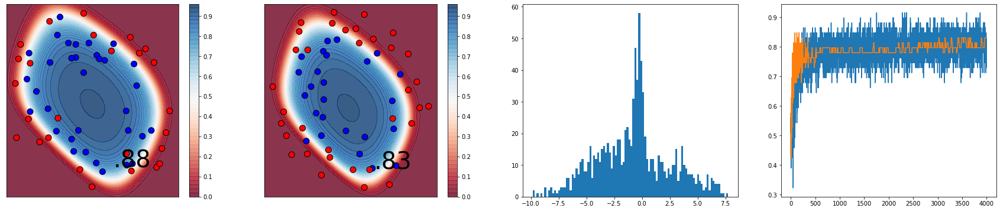

In [163]:
dropouts = [0, 0.1, 0.25, 0.5, 0.75, 0.9]
for dropout in dropouts:
    hidden_units = 500
    escb = EarlyStopping(monitor="loss", patience=200, verbose=0)
    ropcb = ReduceLROnPlateau(monitor="loss", 
                              factor=0.1, 
                              verbose=1, 
                              ]min_lr=0.01, 
                              patience=200)
    epochs = 4000 #adam 3000, sgd 30000
    lr = 0.5
    decay=0
    l2_lambda = 0
    # hidden_units = 20
    optim = optimizers.Adam(lr=lr) # cambiar a momentum 0.9 y lr a 5
    batch_size = 59 # 10 y 59
    activation='sigmoid'

    plot_losses = PlotLosses(plot_interval=200, evaluate_interval=None, x_val=X_test, y_val_categorical=y_test)
    two_layer_model = RHelper.get_two_layer_model_L2(input_shape, 
                                                     output_size, 
                                                     hidden_units=hidden_units, 
                                                     # lr=lr, 
                                                     l2_lambda=l2_lambda, 
                                                     decay=decay,
                                                     optim = optim,
                                                     activation=activation,
                                                     dropout=dropout
                                                    )
    history = two_layer_model.fit(X_train, 
              y_train, batch_size = batch_size,
              epochs=epochs, 
              verbose=0, 
              validation_data=(X_test, y_test), 
              callbacks=[ropcb],
             )
    print(f'dropout: {dropout}, función de activación: {activation}')
    f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(30,6))
    RHelper.plot_boundaries_keras(X_train, y_train, two_layer_model.evaluate(X_train, y_train, verbose=0)[1], two_layer_model.predict_proba, h = 0.01, margin=0.1, ax=ax1)
    RHelper.plot_boundaries_keras(X_test, y_test, two_layer_model.evaluate(X_test, y_test, verbose=0)[1], two_layer_model.predict_proba, h = 0.01, margin=0.1, ax=ax2)
#     ax3.plot(history.history['loss'])
#     ax3.plot(history.history['val_loss'])
    ax3.hist(two_layer_model.get_weights()[0].reshape(-1), 100)
    ax4.plot(history.history['accuracy'])
    ax4.plot(history.history['val_accuracy'])
    plt.show()

# Con max_norm

In [179]:
from keras.layers import Dropout
from keras.constraints import max_norm

model = Sequential()
model.add(Dense(500,  input_dim=2, 
                kernel_constraint = max_norm(5),
                activation='sigmoid'))
model.add(Dropout(dropout))
model.add(Dense(1, activation='sigmoid'))
model.summary()

Model: "sequential_371"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_381 (Dense)            (None, 500)               1500      
_________________________________________________________________
dropout_359 (Dropout)        (None, 500)               0         
_________________________________________________________________
dense_382 (Dense)            (None, 1)                 501       
Total params: 2,001
Trainable params: 2,001
Non-trainable params: 0
_________________________________________________________________



Epoch 04715: ReduceLROnPlateau reducing learning rate to 0.1.
dropout: 0, función de activación: sigmoid


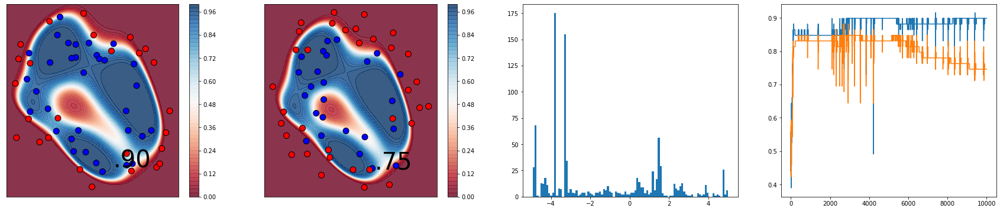


Epoch 01094: ReduceLROnPlateau reducing learning rate to 0.1.

Epoch 02359: ReduceLROnPlateau reducing learning rate to 0.020000000298023225.

Epoch 02859: ReduceLROnPlateau reducing learning rate to 0.01.
dropout: 0.1, función de activación: sigmoid


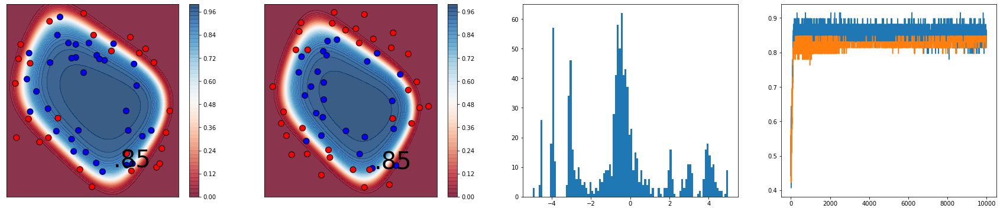


Epoch 00662: ReduceLROnPlateau reducing learning rate to 0.1.

Epoch 01162: ReduceLROnPlateau reducing learning rate to 0.020000000298023225.

Epoch 01662: ReduceLROnPlateau reducing learning rate to 0.01.
dropout: 0.25, función de activación: sigmoid


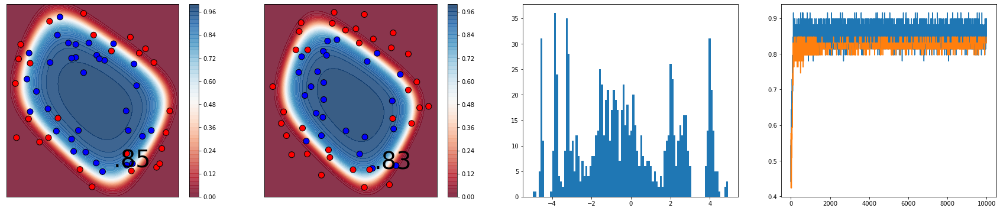


Epoch 01342: ReduceLROnPlateau reducing learning rate to 0.1.

Epoch 02862: ReduceLROnPlateau reducing learning rate to 0.020000000298023225.

Epoch 03362: ReduceLROnPlateau reducing learning rate to 0.01.
dropout: 0.5, función de activación: sigmoid


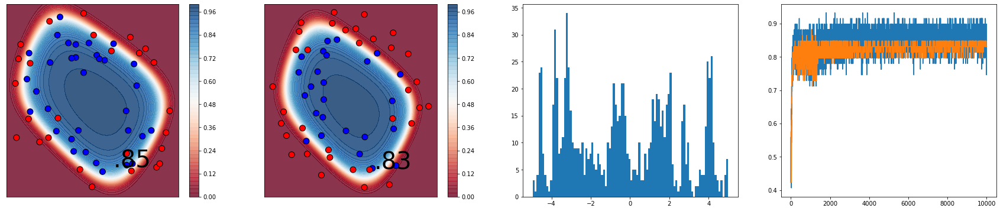


Epoch 00789: ReduceLROnPlateau reducing learning rate to 0.1.

Epoch 01652: ReduceLROnPlateau reducing learning rate to 0.020000000298023225.

Epoch 03198: ReduceLROnPlateau reducing learning rate to 0.01.
dropout: 0.75, función de activación: sigmoid


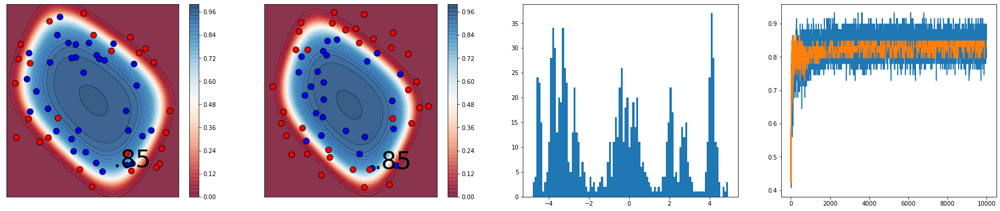


Epoch 01211: ReduceLROnPlateau reducing learning rate to 0.1.

Epoch 01954: ReduceLROnPlateau reducing learning rate to 0.020000000298023225.

Epoch 02797: ReduceLROnPlateau reducing learning rate to 0.01.
dropout: 0.9, función de activación: sigmoid


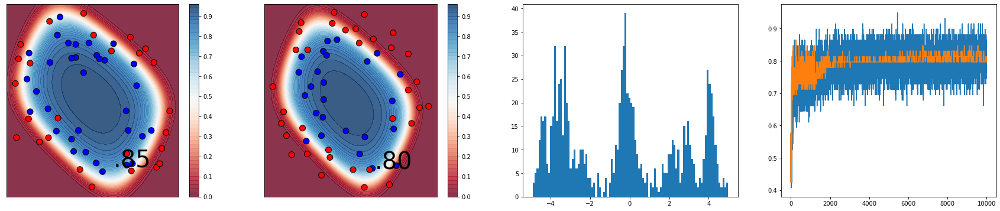

In [174]:
dropouts = [0, 0.1, 0.25, 0.5, 0.75, 0.9]
for dropout in dropouts:
    hidden_units = 500
    escb = EarlyStopping(monitor="loss", patience=300, verbose=0)
    ropcb = ReduceLROnPlateau(monitor="loss", factor=0.2, verbose=1, min_lr=0.01, patience=500)
    epochs = 10000 #adam 3000, sgd 30000
    lr = 0.5
    decay=0
    l2_lambda = 0
    # hidden_units = 20
    optim = optimizers.Adam(lr=lr) # cambiar a momentum 0.9 y lr a 5
    batch_size = 59 # 10 y 59
    activation='sigmoid'

    plot_losses = PlotLosses(plot_interval=200, evaluate_interval=None, x_val=X_test, y_val_categorical=y_test)
    two_layer_model = RHelper.get_two_layer_model_L2(input_shape, 
                                                     output_size, 
                                                     hidden_units=hidden_units, 
                                                     # lr=lr, 
                                                     l2_lambda=l2_lambda, 
                                                     decay=decay,
                                                     optim = optim,
                                                     activation=activation,
                                                     dropout=dropout,
                                                     max_norm_value = 5
                                                    )
    history = two_layer_model.fit(X_train, 
              y_train, batch_size = batch_size,
              epochs=epochs, 
              verbose=0, 
              validation_data=(X_test, y_test), 
              callbacks=[ropcb],
             )
    print(f'dropout: {dropout}, función de activación: {activation}')
    f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(30,6))
    RHelper.plot_boundaries_keras(X_train, y_train, two_layer_model.evaluate(X_train, y_train, verbose=0)[1], two_layer_model.predict_proba, h = 0.01, margin=0.1, ax=ax1)
    RHelper.plot_boundaries_keras(X_test, y_test, two_layer_model.evaluate(X_test, y_test, verbose=0)[1], two_layer_model.predict_proba, h = 0.01, margin=0.1, ax=ax2)
#     ax3.plot(history.history['loss'])
#     ax3.plot(history.history['val_loss'])
    ax3.hist(two_layer_model.get_weights()[0].reshape(-1), 100)
    ax4.plot(history.history['accuracy'])
    ax4.plot(history.history['val_accuracy'])
    plt.show()